# Fase 9: Pipeline CNN com Resize Adaptativo + Janela Deslizante

Este notebook implementa o fluxo completo da Fase 9 com resize adaptativo offline e janela deslizante (sliding window),
eliminando artefatos de `BORDER_REPLICATE` e a sobreposição redundante da ROI.

### Mudanças em relação à Fase 6

| Aspecto | Fase 6 | Fase 9 |
|---|---|---|
| Preenchimento de borda periférica | `BORDER_REPLICATE` — listras artificiais | **Sliding Window** — desliza para dentro, 100% pixels reais |
| Sobreposição da ROI | Colava o crop redimensionado por cima | **Removida** — background já escala a lesão simetricamente |
| Fallback microscópico | `BORDER_REPLICATE` | `BORDER_REFLECT_101` — espelho da textura óssea |
| Diretório base | `fase6/` | `fase9/` |

```
# Instalacoes necessarias (se nao estiverem instaladas)
# !pip install timm rich matplotlib seaborn pandas opencv-python pytorch-grad-cam albumentations
```


## Módulo 1: Cropping + Resize Adaptativo Offline (384×384)

Recorta a lesão com padding de 40% e salva o dataset final em 384×384 usando:
- **Sliding Window**: a janela de contexto desliza para dentro da radiografia quando a lesão é periférica,
  garantindo 100% de pixels anatômicos reais.
- **Sem sobreposição**: o background redimensionado já é o output final — não há colagem da ROI por cima.


In [ ]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
import json
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
import gc

# Definicoes Unificadas da Fase 9
BASE_FASE9 = '.'
DIR_DATASET = os.path.join(BASE_FASE9, 'dataset')
PASTAS = ['treino', 'val', 'teste']
CLASSES = ['benigno', 'maligno']

# Caminhos do workspace
DIR_IMAGENS_ORIGINAIS = os.path.join(BASE_FASE9, '../../data/images')
DIR_ANOTACOES = os.path.join(BASE_FASE9, '../../data/Annotations')
CSV_ORIGINAL = os.path.join(BASE_FASE9, '../../data/metadados/dataset_kfold_controle.csv')
CSV_CONTROLE_FASE9 = os.path.join(BASE_FASE9, 'dataset_controle_fase9.csv')

# Parametros do resize adaptativo
PADDING = 0.40
TARGET_SIZE = 384


def calcular_bbox_geral(shapes):
    all_points = []
    for shape in shapes:
        for p in shape.get('points', []):
            all_points.append(p)
    if not all_points:
        return None
    all_points = np.array(all_points)
    return (int(np.min(all_points[:, 0])), int(np.min(all_points[:, 1])),
            int(np.max(all_points[:, 0])), int(np.max(all_points[:, 1])))


def preparar_pastas():
    for p in PASTAS:
        for c in CLASSES:
            os.makedirs(os.path.join(DIR_DATASET, p, c), exist_ok=True)


def extract_window_sliding(img, x1, y1, x2, y2):
    """
    Janela Deslizante (Sliding Window).

    Quando a janela de contexto transbordaria a imagem original, em vez de inventar
    pixels com BORDER_REPLICATE, a janela desliza para dentro absorvendo pixels reais
    do lado oposto. Garante 100% de fundo anatomico verdadeiro.
    """
    h, w = img.shape[:2]
    win_w = x2 - x1
    win_h = y2 - y1

    # deslizamento horizontal
    if x1 < 0:
        shift = -x1
        x1 += shift
        x2 = min(w, x2 + shift)
    if x2 > w:
        shift = x2 - w
        x2 -= shift
        x1 = max(0, x1 - shift)

    # deslizamento vertical
    if y1 < 0:
        shift = -y1
        y1 += shift
        y2 = min(h, y2 + shift)
    if y2 > h:
        shift = y2 - h
        y2 -= shift
        y1 = max(0, y1 - shift)

    window = img[y1:y2, x1:x2]

    # fallback microscopico: imagem menor que a janela solicitada
    need_pad_w = win_w - window.shape[1]
    need_pad_h = win_h - window.shape[0]
    if need_pad_w > 0 or need_pad_h > 0:
        window = cv2.copyMakeBorder(
            window, 0, max(0, need_pad_h), 0, max(0, need_pad_w),
            cv2.BORDER_REFLECT_101)

    return window

def recortar_sliding_com_padding_rigoroso(img, x1, y1, x2, y2, pad_val, target=TARGET_SIZE):
    """
    Resize adaptativo importado da Fase 11.5
    """
    # Calcula padding estrito baseado na anotação bruta
    pad_x, pad_y = int((x2 - x1) * pad_val), int((y2 - y1) * pad_val)
    nx1, nx2 = x1 - pad_x, x2 + pad_x
    ny1, ny2 = y1 - pad_y, y2 + pad_y
    
    # Adquire um quadrado geométrico perfeito baseado na maior expansão para evitar distorção no resize
    cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
    win_size = max(nx2 - nx1, ny2 - ny1)
    
    wx1, wy1 = cx - win_size // 2, cy - win_size // 2
    wx2, wy2 = wx1 + win_size, wy1 + win_size
    
    # Chama a janela mágica de preservação espacial
    ctx_img = extract_window_sliding(img, wx1, wy1, wx2, wy2)
    interp = cv2.INTER_AREA if (ctx_img.shape[1] > target or ctx_img.shape[0] > target) else cv2.INTER_CUBIC
    return cv2.resize(ctx_img, (target, target), interpolation=interp)


def gerar_crops_e_separar_resize_adaptativo():
    preparar_pastas()

    if not os.path.exists(CSV_ORIGINAL):
        print(f'ERRO: CSV nao encontrado em: {os.path.abspath(CSV_ORIGINAL)}')
        return
    if not os.path.exists(DIR_IMAGENS_ORIGINAIS):
        print(f'ERRO: Pasta de imagens nao encontrada em: {os.path.abspath(DIR_IMAGENS_ORIGINAIS)}')
        return
    if not os.path.exists(DIR_ANOTACOES):
        print(f'ERRO: Pasta de anotacoes nao encontrada em: {os.path.abspath(DIR_ANOTACOES)}')
        return

    df = pd.read_csv(CSV_ORIGINAL)
    novas_linhas = []

    print('Gerando crops com resize adaptativo + sliding window para Fase 9...')
    for _, row in tqdm(df.iterrows(), total=len(df)):
        cls_name = row['class_name']
        img_id = row['image_id']
        split = row['split_group']
        fold = row['fold']

        if split == 'teste_final':
            pasta_destino = 'teste'
        elif fold == 0:
            pasta_destino = 'val'
        else:
            pasta_destino = 'treino'

        caminho_img = os.path.join(DIR_IMAGENS_ORIGINAIS, img_id)
        nome_sem_ext = os.path.splitext(img_id)[0]
        caminho_json = os.path.join(DIR_ANOTACOES, f'{nome_sem_ext}.json')

        if not os.path.exists(caminho_img) or not os.path.exists(caminho_json):
            continue

        with open(caminho_json, 'r', encoding='utf-8') as f:
            data = json.load(f)

        img = cv2.imread(caminho_img)
        if img is None:
            continue

        bbox = calcular_bbox_geral(data.get('shapes', []))
        if bbox is None:
            del img
            continue

        x1, y1, x2, y2 = bbox
        
        # O PADDING geometrico rigoroso da Fase 11 acionado em uniao a Janela
        final_384 = recortar_sliding_com_padding_rigoroso(img, x1, y1, x2, y2, pad_val=PADDING, target=TARGET_SIZE)

        if final_384 is None or final_384.size == 0:
            del img
            continue

        cv2.imwrite(os.path.join(DIR_DATASET, pasta_destino, cls_name, img_id), final_384)

        # Controle Estrito de Memoria RAM Host
        del img, final_384

        nova_linha = row.copy()
        nova_linha['split_fase9'] = pasta_destino
        nova_linha['resize_modelo'] = 'sliding_window_sem_sobreposicao'
        nova_linha['target_size'] = TARGET_SIZE
        nova_linha['s_max'] = S_MAX
        novas_linhas.append(nova_linha)

    df_fase9 = pd.DataFrame(novas_linhas)
    df_fase9.to_csv(CSV_CONTROLE_FASE9, index=False)
    
    # Inicia descarte manual e chama Garbage Collector
    gc.collect()
    print(f'Dataset Fase 9 salvo com sliding window (RIGOROSO PADDING=40%): {CSV_CONTROLE_FASE9}')


# Descomente para rodar
# gerar_crops_e_separar_resize_adaptativo()


## Módulo 2: O Filtro X-Ray (CLAHE Offline)

Em vez de processar por epoch, a equalização contrastiva a limiar é aplicada diretamente
nos JPGs recortados no passo anterior para acelerar a fase de treinamento.


In [14]:
def aplicar_clahe_offline():
    print('Aplicando Adaptacao Limitada ao Histograma (CLAHE)...')
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))

    for pasta in PASTAS:
        for cls_name in CLASSES:
            caminho = os.path.join(DIR_DATASET, pasta, cls_name)
            if not os.path.exists(caminho):
                continue
            arquivos = os.listdir(caminho)
            for arq in tqdm(arquivos, desc=f'CLAHE ({pasta} | {cls_name})'):
                path_arq = os.path.join(caminho, arq)
                img = cv2.imread(path_arq)
                if img is None:
                    continue
                lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
                l, a, b = cv2.split(lab)
                cl = clahe.apply(l)
                limg = cv2.merge((cl, a, b))
                final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
                # OVERWRITE direto na imagem. Offline final state.
                cv2.imwrite(path_arq, final)
    print('Aprimoramento X-Ray Offline 100% gravado!')


# Descomente para aplicar CLAHE (rode 1x apenas)
# aplicar_clahe_offline()


## Módulo 3: Treinamento CNN com Dataset Adaptativo

Treinamento das CNNs usando o dataset da Fase 9 já salvo em 384×384 pelo resize adaptativo
com sliding window. Como as imagens já saem com o tamanho correto do Módulo 1,
`RandomResizedCrop` é mantido fora para não reintroduzir distorção de escala.


In [15]:
def limpar_cache_gpu():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.synchronize()

In [8]:
import os
import random
import time
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, WeightedRandomSampler
from torchvision import transforms, datasets
import timm

SEED = 42

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(SEED)
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Caminhos da Fase 9
BASE_FASE9 = globals().get('BASE_FASE9', '.')
DIR_DATASET = globals().get('DIR_DATASET', os.path.join(BASE_FASE9, 'dataset'))

EPOCHS = 200
PATIENCE = 15
LR = 1e-4
IMG_SIZE = 384
LABEL_SMOOTHING = 0.1
DROP_PATH_RATE = 0.2
ACC_STEPS = 2

CNN_MODELS = [
    {'name': 'tf_efficientnetv2_l', 'batch': 6,  'radimagenet': False},
    {'name': 'efficientnet_b1', 'batch': 30, 'radimagenet': False},
    {'name': 'resnet50',            'batch': 24, 'radimagenet': False},
    {'name': 'densenet121',         'batch': 20, 'radimagenet': False},
    {'name': 'convnext_tiny', 'batch': 24, 'radimagenet': False},
]

DIR_MODELOS_SALVOS = os.path.join(BASE_FASE9, 'modelos_fase9')
os.makedirs(DIR_MODELOS_SALVOS, exist_ok=True)
PASTA_PESOS_RAD_GLOBAL = os.path.join(BASE_FASE9, '../../modelos/pesos_radimagenet')

# Como as imagens ja saem 384x384 do modulo 1, removemos RandomResizedCrop
# para nao reintroduzir distorcao de escala
train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

val_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])


def carregar_pesos_rad_global(model, model_name):
    nome_arquivo = ''
    if 'resnet50' in model_name:
        nome_arquivo = 'RadImageNet-ResNet50_notop.pth'
    elif 'densenet121' in model_name:
        nome_arquivo = 'DenseNet121.pt'

    caminho = os.path.join(PASTA_PESOS_RAD_GLOBAL, nome_arquivo)
    if not os.path.exists(caminho):
        caminho_alt = os.path.join(PASTA_PESOS_RAD_GLOBAL, f'{model_name}.pt')
        if os.path.exists(caminho_alt):
            caminho = caminho_alt

    if os.path.exists(caminho):
        state_dict = torch.load(caminho, map_location='cpu')
        model.load_state_dict(state_dict, strict=False)
        print(' -> [!] Pesos do RadImageNet carregados com sucesso da pasta global!')
        return True
    return False


def treinar_modelo_cnn(config):
    model_name = config['name']
    batch_size = config['batch']
    usar_rad = config['radimagenet']
    print(f"\n{'='*50}\n-> FASE 9 | INICIANDO REDE: {model_name} (Batch: {batch_size})\n{'='*50}")

    train_dataset = datasets.ImageFolder(os.path.join(DIR_DATASET, 'treino'), transform=train_transforms)
    val_dataset   = datasets.ImageFolder(os.path.join(DIR_DATASET, 'val'),    transform=val_transforms)

    class_counts = np.bincount(train_dataset.targets)
    weights = 1.0 / class_counts
    samples_weights = weights[train_dataset.targets]
    sampler = WeightedRandomSampler(samples_weights, len(samples_weights), replacement=True)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler=sampler,
                              num_workers=0, pin_memory=True)
    val_loader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=False,
                              num_workers=0, pin_memory=True)

    try:
        model = timm.create_model(model_name, pretrained=True, num_classes=2,
                                  drop_path_rate=DROP_PATH_RATE)
    except Exception:
        model = timm.create_model(model_name, pretrained=True, num_classes=2)

    if usar_rad:
        carregar_pesos_rad_global(model, model_name)

    model = model.to(DEVICE)
    criterion = nn.CrossEntropyLoss(label_smoothing=LABEL_SMOOTHING)
    optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2)
    scaler = torch.amp.GradScaler('cuda', enabled=True)

    best_loss = float('inf')
    patience_count = 0
    save_path = os.path.join(DIR_MODELOS_SALVOS, f'{model_name}_fase9.pth')

    for epoch in range(EPOCHS):
        model.train()
        train_loss = 0.0
        optimizer.zero_grad()

        for i, (imgs, lbls) in enumerate(train_loader):
            imgs, lbls = imgs.to(DEVICE), lbls.to(DEVICE)
            with torch.amp.autocast('cuda', enabled=True):
                outputs = model(imgs)
                loss = criterion(outputs, lbls) / ACC_STEPS
            scaler.scale(loss).backward()
            if (i + 1) % ACC_STEPS == 0 or (i + 1) == len(train_loader):
                scaler.step(optimizer)
                scaler.update()
                optimizer.zero_grad()
            train_loss += loss.item() * ACC_STEPS

        avg_train = train_loss / len(train_loader)
        scheduler.step()

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for imgs, lbls in val_loader:
                imgs, lbls = imgs.to(DEVICE), lbls.to(DEVICE)
                outputs = model(imgs)
                val_loss += criterion(outputs, lbls).item()

        avg_val = val_loss / len(val_loader)
        print(f'Epoca {epoch+1:02d}/{EPOCHS} | Train Loss: {avg_train:.4f} | Val Loss: {avg_val:.4f}', end=' ')

        if avg_val < best_loss:
            best_loss = avg_val
            patience_count = 0
            torch.save(model.state_dict(), save_path)
            print(' [SALVO]')
        else:
            patience_count += 1
            print(f' [Patience: {patience_count}/{PATIENCE}]')
            if patience_count >= PATIENCE:
                print('\n[!] Early Stopping disparado')
                break

# for config in CNN_MODELS:
#     treinar_modelo_cnn(config)
#     limpar_cache_gpu()


## Módulo 4: Teste Cego e Matrizes (Fase 9)

Avaliação no conjunto de teste com as métricas do experimento da Fase 9,
usando os modelos treinados com resize adaptativo + sliding window.



Rodando teste cego para -> tf_efficientnetv2_l


C:\Users\jffil\AppData\Local\Temp\ipykernel_4808\158961257.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_location=DEVI


Rodando teste cego para -> efficientnet_b1


C:\Users\jffil\AppData\Local\Temp\ipykernel_4808\158961257.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_location=DEVI


Rodando teste cego para -> resnet50


C:\Users\jffil\AppData\Local\Temp\ipykernel_4808\158961257.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_location=DEVI


Rodando teste cego para -> densenet121


C:\Users\jffil\AppData\Local\Temp\ipykernel_4808\158961257.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_location=DEVI


Rodando teste cego para -> convnext_tiny


C:\Users\jffil\AppData\Local\Temp\ipykernel_4808\158961257.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_location=DEVI

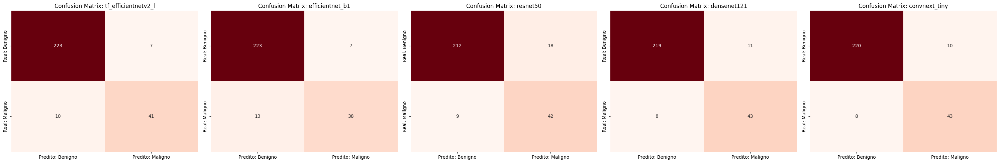


--- TESTE FINAL FASE 9 CONCLUIDO ---


,Rede,Acuracia,AUC,F1-Score,Precisao,Recall (Sensibilidade)
0,tf_efficientnetv2_l,0.9395,0.9412,0.8283,0.8542,0.8039
1,efficientnet_b1,0.9288,0.9623,0.7917,0.8444,0.7451
2,resnet50,0.9039,0.9611,0.7568,0.7000,0.8235
3,densenet121,0.9324,0.9501,0.8190,0.7963,0.8431
4,convnext_tiny,0.9359,0.9328,0.8269,0.8113,0.8431


In [11]:
from sklearn.metrics import (accuracy_score, f1_score, recall_score,
                             precision_score, roc_auc_score, confusion_matrix)
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

CSV_RESULTADOS_FINAIS = os.path.join(BASE_FASE9, 'RESULTADOS_TESTE_FASE9.csv')


def validar_teste_cego():
    test_dataset = datasets.ImageFolder(
        os.path.join(DIR_DATASET, 'teste'), transform=val_transforms)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

    resultados = []
    fig, axes = plt.subplots(1, len(CNN_MODELS), figsize=(6 * len(CNN_MODELS), 5))
    if len(CNN_MODELS) == 1:
        axes = [axes]

    for idx, config in enumerate(CNN_MODELS):
        model_name = config['name']
        save_path = os.path.join(DIR_MODELOS_SALVOS, f'{model_name}_fase9.pth')

        if not os.path.exists(save_path):
            print(f'Modelo [{model_name}] nao existe!')
            continue

        print(f'\nRodando teste cego para -> {model_name}')
        try:
            model = timm.create_model(model_name, num_classes=2, drop_path_rate=DROP_PATH_RATE)
        except Exception:
            model = timm.create_model(model_name, num_classes=2)

        model.load_state_dict(torch.load(save_path, map_location=DEVICE))
        model.to(DEVICE)
        model.eval()

        all_preds, all_lbls, all_probs = [], [], []
        with torch.no_grad():
            for imgs, lbls in test_loader:
                imgs = imgs.to(DEVICE)
                outputs = model(imgs)
                probs = torch.softmax(outputs, dim=1)[:, 1]
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_lbls.extend(lbls.numpy())
                all_probs.extend(probs.cpu().numpy())

        acc  = accuracy_score(all_lbls, all_preds)
        f1   = f1_score(all_lbls, all_preds)
        rec  = recall_score(all_lbls, all_preds)
        prec = precision_score(all_lbls, all_preds)
        auc  = roc_auc_score(all_lbls, all_probs)

        resultados.append({
            'Rede': model_name,
            'Acuracia': round(acc, 4),
            'AUC': round(auc, 4),
            'F1-Score': round(f1, 4),
            'Precisao': round(prec, 4),
            'Recall (Sensibilidade)': round(rec, 4),
        })

        cm = confusion_matrix(all_lbls, all_preds)
        sns.heatmap(
            cm, annot=True, fmt='d', cmap='Reds', ax=axes[idx], cbar=False,
            xticklabels=['Predito: Benigno', 'Predito: Maligno'],
            yticklabels=['Real: Benigno', 'Real: Maligno'],
        )
        axes[idx].set_title(f'Confusion Matrix: {model_name}')

    plt.tight_layout()
    plt.savefig(os.path.join(BASE_FASE9, 'Matrizes_Confusao_CNNs_Fase9.png'), dpi=300)
    plt.show()

    df_res = pd.DataFrame(resultados)
    df_res.to_csv(CSV_RESULTADOS_FINAIS, index=False)
    print('\n--- TESTE FINAL FASE 9 CONCLUIDO ---')
    display(df_res)


# Descomente para testar e printar os graficos
validar_teste_cego()


## Módulo 5: Explicabilidade Grad-CAM (Fase 9)

Bloco de explicabilidade visual para inspecionar o foco das CNNs treinadas
com o novo resize adaptativo + sliding window.



Iniciando Grad-CAM Fase 9 -> tf_efficientnetv2_l


C:\Users\jffil\AppData\Local\Temp\ipykernel_4808\835854144.py:126: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path, map_location=DEV

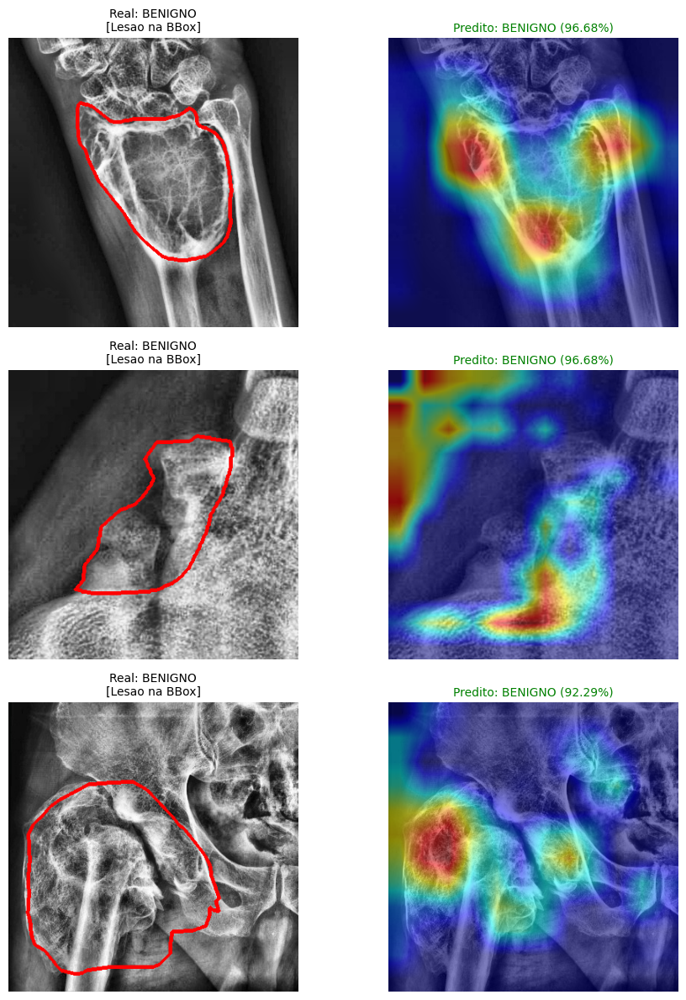

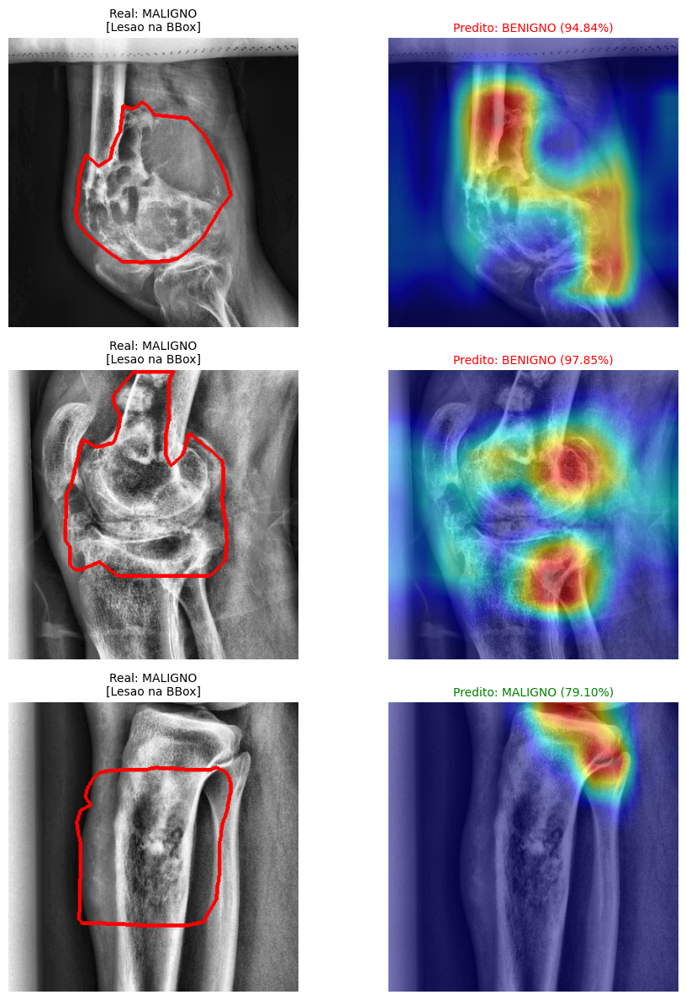


Iniciando Grad-CAM Fase 9 -> efficientnet_b1


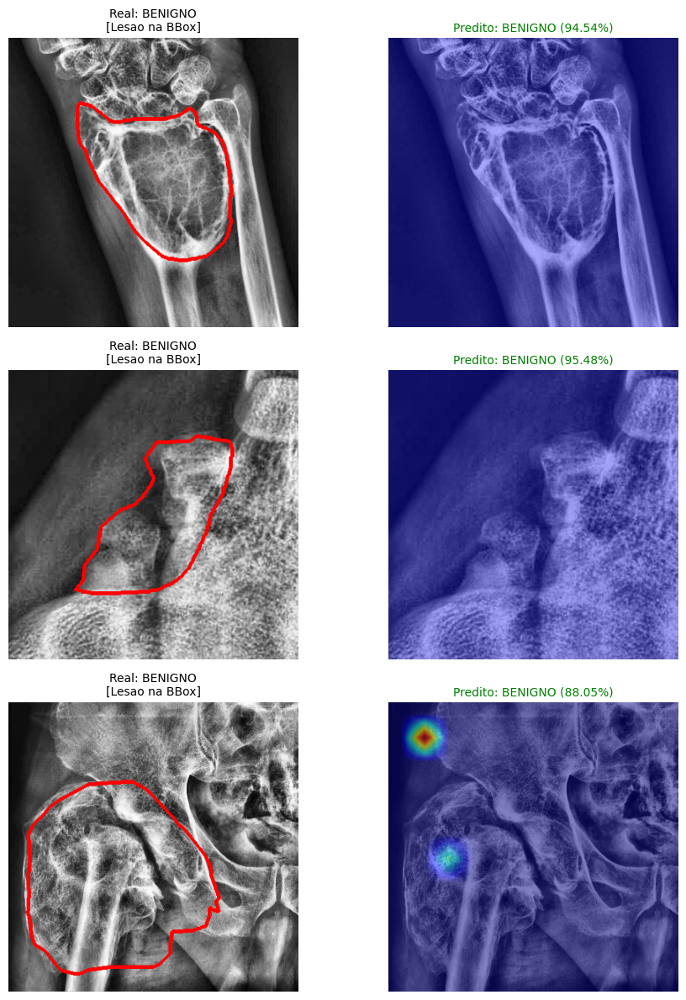

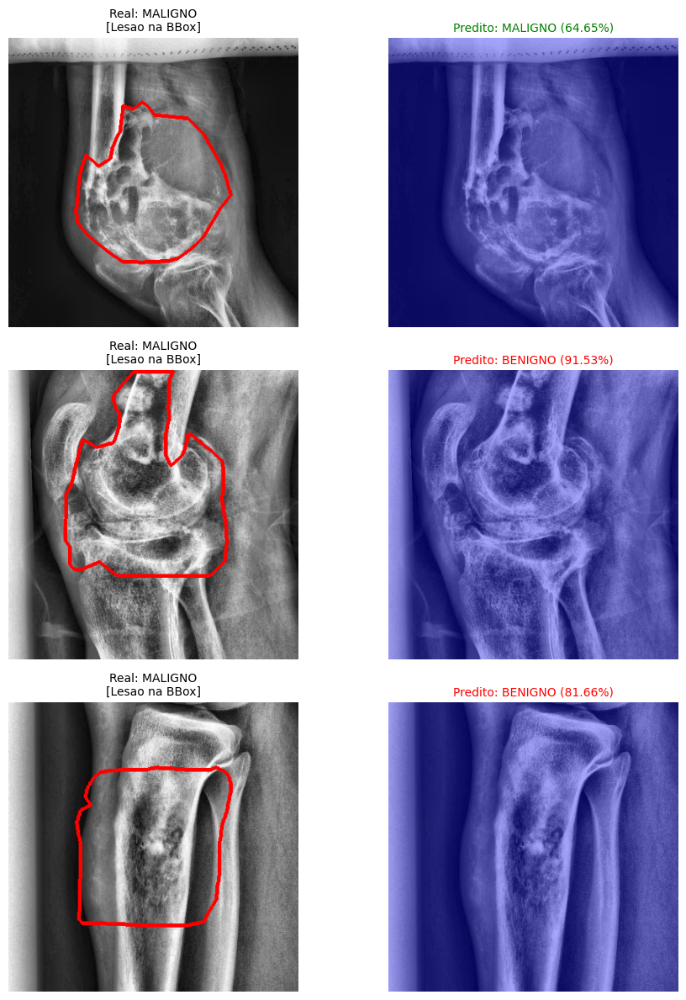


Iniciando Grad-CAM Fase 9 -> resnet50


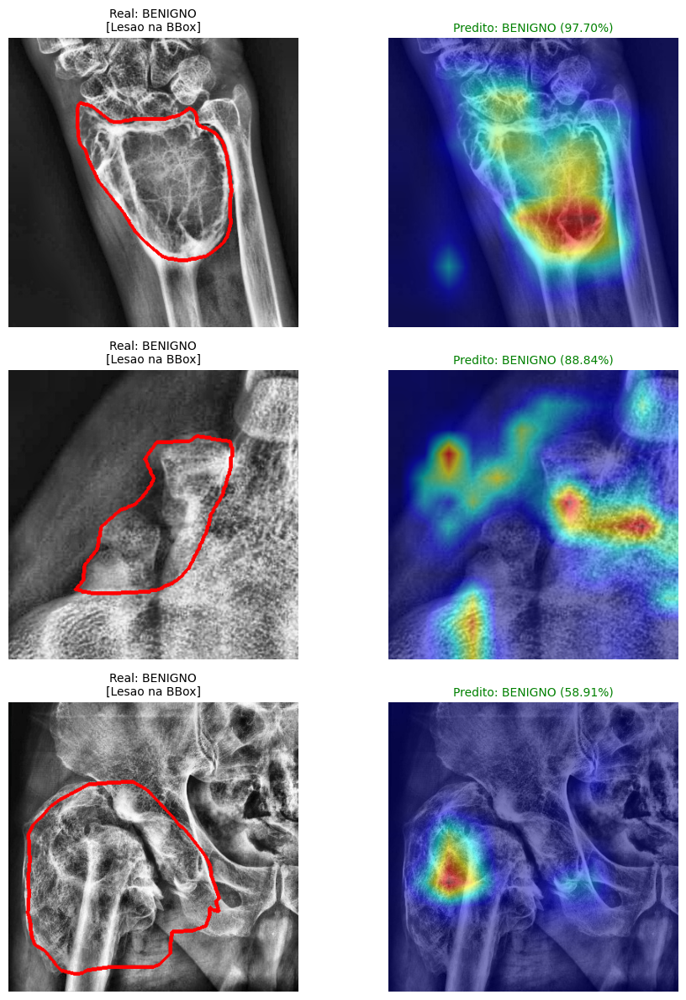

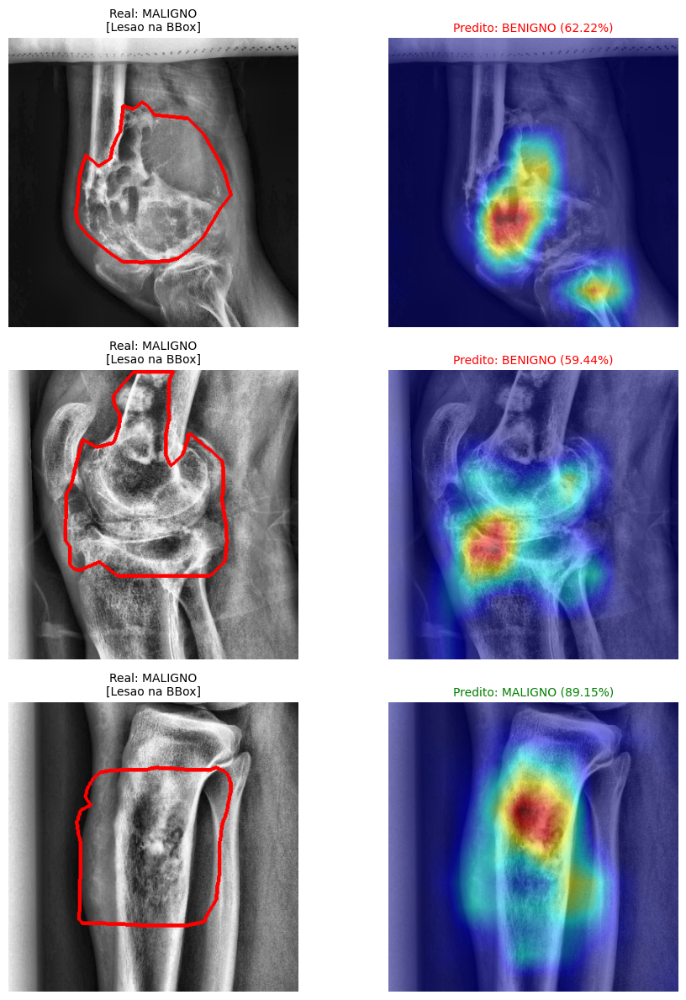


Iniciando Grad-CAM Fase 9 -> densenet121


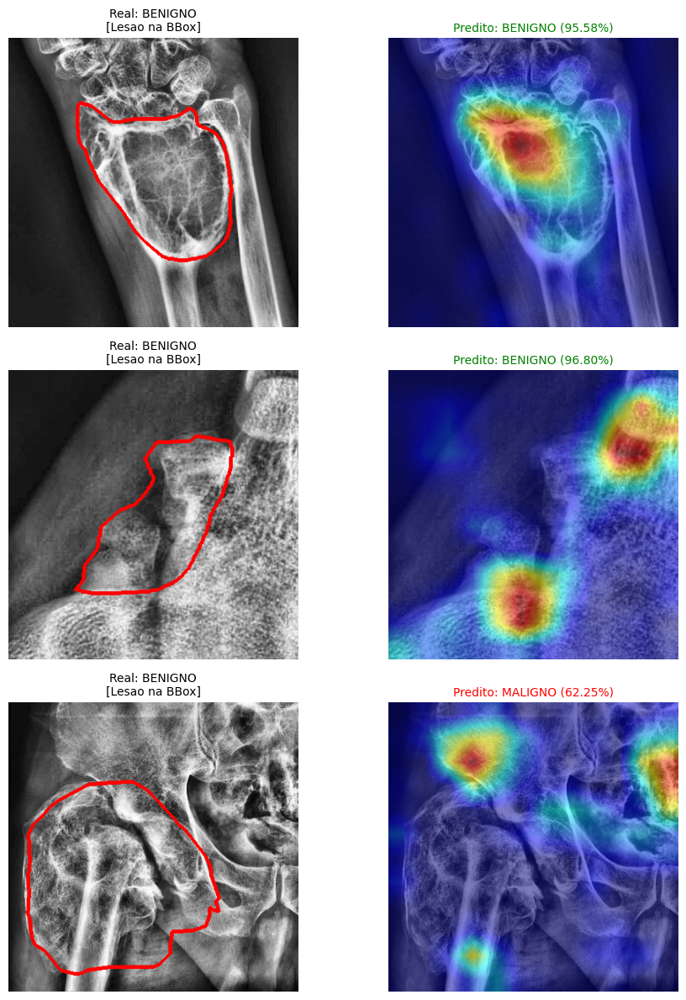

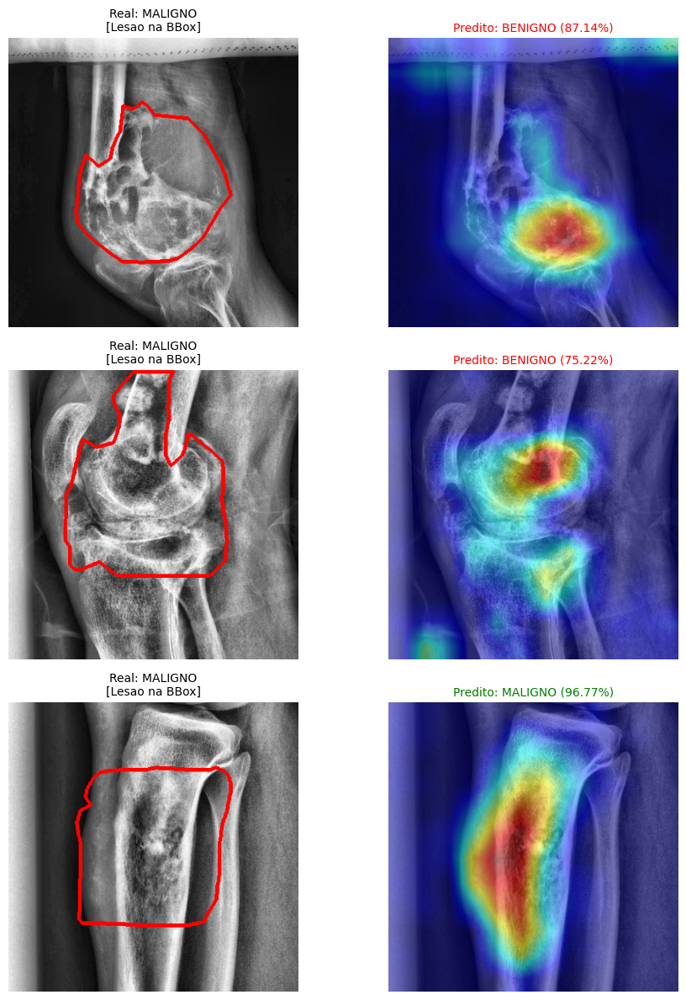


Iniciando Grad-CAM Fase 9 -> convnext_tiny


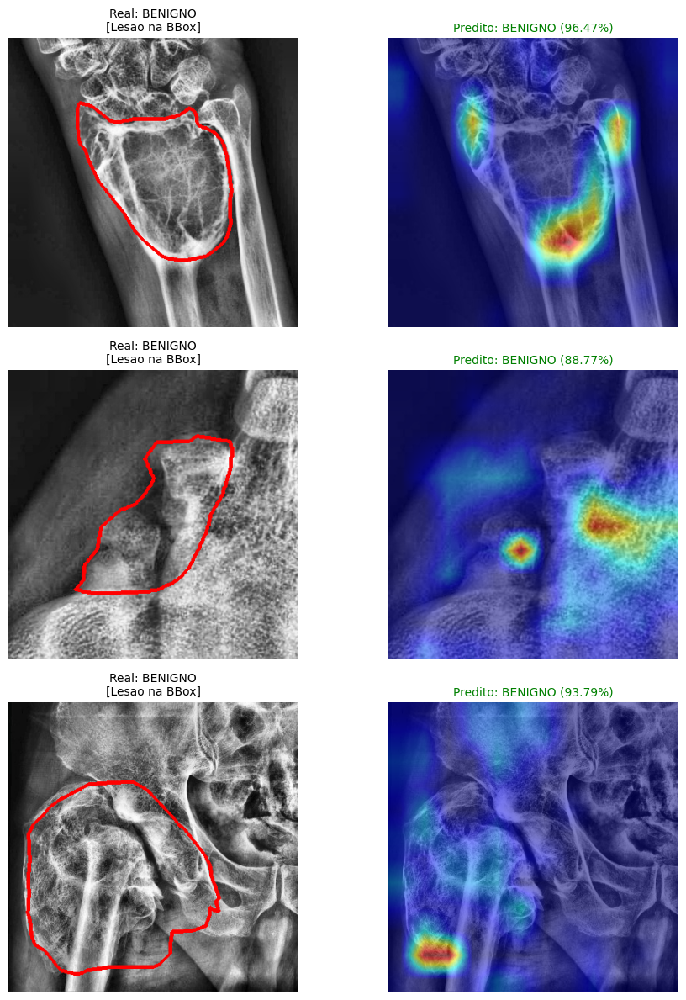

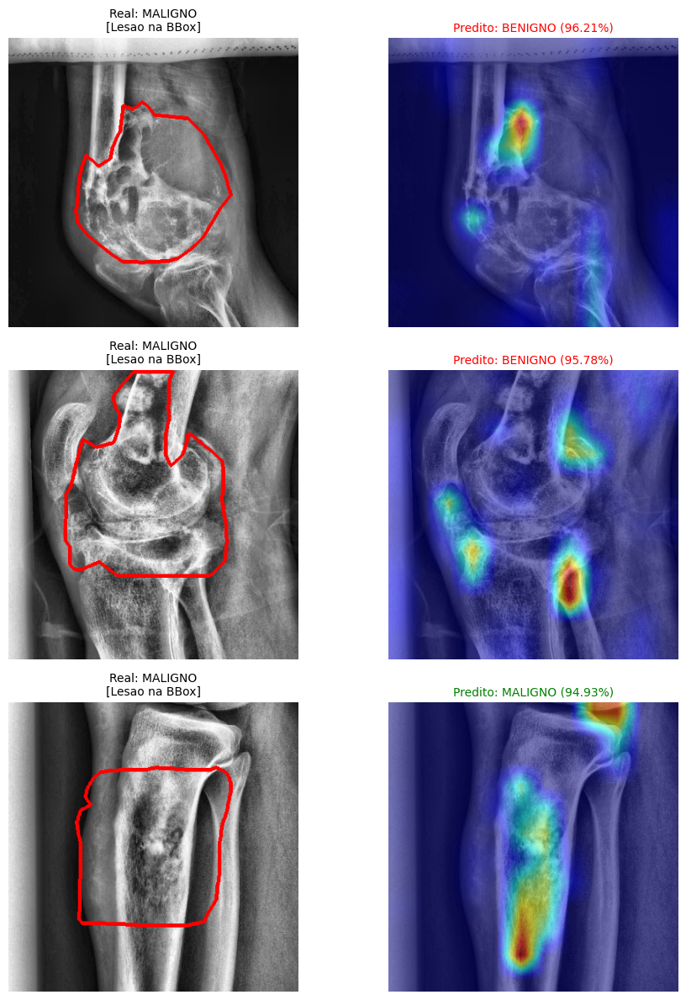

In [10]:
import os
import json
import cv2
import numpy as np
import torch
import timm
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

# Fallbacks da Fase 9
BASE_FASE9 = globals().get('BASE_FASE9', '.')
DIR_DATASET = globals().get('DIR_DATASET', os.path.join(BASE_FASE9, 'dataset'))
CLASSES = globals().get('CLASSES', ['benigno', 'maligno'])
DIR_IMAGENS_ORIGINAIS = globals().get('DIR_IMAGENS_ORIGINAIS', os.path.join(BASE_FASE9, '../../data/images'))
DIR_ANOTACOES = globals().get('DIR_ANOTACOES', os.path.join(BASE_FASE9, '../../data/Annotations'))
DIR_MODELOS_SALVOS = globals().get('DIR_MODELOS_SALVOS', os.path.join(BASE_FASE9, 'modelos_fase9'))
PADDING = globals().get('PADDING', 0.40)
DEVICE = globals().get('DEVICE', 'cuda' if torch.cuda.is_available() else 'cpu')

if 'val_transforms' not in globals():
    IMG_SIZE = globals().get('IMG_SIZE', 384)
    val_transforms = transforms.Compose([
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    ])

if 'CNN_MODELS' not in globals():
    CNN_MODELS = [
    {'name': 'tf_efficientnetv2_l', 'batch': 6,  'radimagenet': False},
    {'name': 'efficientnet_b1', 'batch': 30, 'radimagenet': False},
    {'name': 'resnet50',            'batch': 24, 'radimagenet': False},
    {'name': 'densenet121',         'batch': 20, 'radimagenet': False},
    {'name': 'convnext_tiny', 'batch': 24, 'radimagenet': False},
]

if 'calcular_bbox_geral' not in globals():
    def calcular_bbox_geral(shapes):
        all_points = []
        for shape in shapes:
            for p in shape.get('points', []):
                all_points.append(p)
        if not all_points:
            return None
        all_points = np.array(all_points)
        return (int(np.min(all_points[:, 0])), int(np.min(all_points[:, 1])),
                int(np.max(all_points[:, 0])), int(np.max(all_points[:, 1])))

DIR_GRADCAM = os.path.join(BASE_FASE9, 'GradCAM_Heatmaps_Fase9')
os.makedirs(DIR_GRADCAM, exist_ok=True)


def desenhar_contorno_lesao(img_rgb_crop, arquivo_imagem):
    nome_sem_ext = os.path.splitext(arquivo_imagem)[0]
    caminho_json = os.path.join(DIR_ANOTACOES, f'{nome_sem_ext}.json')
    caminho_img_original = os.path.join(DIR_IMAGENS_ORIGINAIS, arquivo_imagem)

    if not os.path.exists(caminho_json) or not os.path.exists(caminho_img_original):
        return img_rgb_crop, False

    try:
        with open(caminho_json, 'r', encoding='utf-8') as f:
            data = json.load(f)

        img_original = cv2.imread(caminho_img_original)
        if img_original is None:
            return img_rgb_crop, False

        bbox = calcular_bbox_geral(data.get('shapes', []))
        if bbox is None:
            return img_rgb_crop, False

        x1, y1, x2, y2 = bbox
        h_orig, w_orig = img_original.shape[:2]
        pad_x = int((x2 - x1) * PADDING)
        pad_y = int((y2 - y1) * PADDING)
        nx1, ny1 = max(0, x1 - pad_x), max(0, y1 - pad_y)
        nx2, ny2 = min(w_orig, x2 + pad_x), min(h_orig, y2 + pad_y)

        mask_full = np.zeros((h_orig, w_orig), dtype=np.uint8)
        for shape in data.get('shapes', []):
            points = shape.get('points', [])
            if len(points) < 3:
                continue
            pts = np.array(points, dtype=np.int32)
            cv2.fillPoly(mask_full, [pts], 255)

        mask_crop = mask_full[ny1:ny2, nx1:nx2]
        h_crop, w_crop = img_rgb_crop.shape[:2]
        if mask_crop.shape[:2] != (h_crop, w_crop):
            mask_crop = cv2.resize(mask_crop, (w_crop, h_crop),
                                   interpolation=cv2.INTER_NEAREST)

        contours, _ = cv2.findContours(mask_crop, cv2.RETR_EXTERNAL,
                                       cv2.CHAIN_APPROX_SIMPLE)
        img_out = img_rgb_crop.copy()
        if len(contours) > 0:
            cv2.drawContours(img_out, contours, -1, (255, 0, 0), 3)
            return img_out, True
        return img_out, False
    except Exception:
        return img_rgb_crop, False


def obter_predicao_modelo(model, img_tensor, device):
    with torch.no_grad():
        outputs = model(img_tensor.to(device))
        probs = torch.softmax(outputs, dim=1)
        _, pred_idx = torch.max(outputs, 1)
    pred_idx = pred_idx.item()
    return pred_idx, CLASSES[pred_idx], probs[0, pred_idx].item()


def espionar_visao_modelo(model_name='tf_efficientnetv2_l', imagens_por_classe=3):
    print(f'\nIniciando Grad-CAM Fase 9 -> {model_name}')
    save_path = os.path.join(DIR_MODELOS_SALVOS, f'{model_name}_fase9.pth')
    if not os.path.exists(save_path):
        print(f'Modelo nao encontrado: {save_path}')
        return

    model = timm.create_model(model_name, num_classes=2).to(DEVICE)
    model.load_state_dict(torch.load(save_path, map_location=DEVICE))
    model.eval()

    if 'densenet' in model_name:
        target_layers = [model.features[-1]]
    elif 'resnet' in model_name:
        target_layers = [model.layer4[-1]]
    elif 'convnext' in model_name:
        # ConvNeXt: último bloco do último estágio (acessando via .blocks)
        target_layers = [model.stages[-1].blocks[-1]]
    elif 'swin' in model_name:
        # Swin Transformer: última normalização do último bloco
        target_layers = [model.layers[-1].blocks[-1].norm2]
    elif 'efficientnet' in model_name or 'tf_efficientnet' in model_name:
        target_layers = [model.conv_head]
    else:
        # fallback genérico (pode não funcionar para todos)
        target_layers = [list(model.children())[-2]]

    cam = GradCAM(model=model, target_layers=target_layers)

    for cls in CLASSES:
        pasta_alvo = os.path.join(DIR_DATASET, 'teste', cls)
        arquivos = [
            a for a in os.listdir(pasta_alvo)
            if a.lower().endswith(('.jpg', '.jpeg', '.png'))
        ][:imagens_por_classe]

        if not arquivos:
            continue

        fig, axes = plt.subplots(len(arquivos), 2, figsize=(10, 4 * len(arquivos)))
        if len(arquivos) == 1:
            axes = [axes]

        for idx, arq in enumerate(arquivos):
            path_img = os.path.join(pasta_alvo, arq)
            img_cv = cv2.imread(path_img)
            if img_cv is None:
                continue

            img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
            img_norm = np.float32(img_rgb) / 255
            h_orig, w_orig = img_rgb.shape[:2]

            img_com_contorno, tem_contorno = desenhar_contorno_lesao(img_rgb.copy(), arq)
            input_tensor = val_transforms(Image.fromarray(img_rgb)).unsqueeze(0)
            pred_idx, classe_pred, confianca = obter_predicao_modelo(model, input_tensor, DEVICE)

            targets = [ClassifierOutputTarget(pred_idx)]
            grayscale_cam = cam(input_tensor=input_tensor.to(DEVICE), targets=targets)[0, :]
            grayscale_cam_resized = cv2.resize(grayscale_cam, (w_orig, h_orig))
            cam_image = show_cam_on_image(img_norm, grayscale_cam_resized, use_rgb=True)

            extra = '[Lesao na BBox]' if tem_contorno else '[Sem contorno]'
            axes[idx][0].imshow(img_com_contorno)
            axes[idx][0].set_title(f'Real: {cls.upper()}\n{extra}', fontsize=10)
            axes[idx][0].axis('off')

            cor = 'green' if classe_pred == cls else 'red'
            axes[idx][1].imshow(cam_image)
            axes[idx][1].set_title(
                f'Predito: {classe_pred.upper()} ({confianca:.2%})', fontsize=10, color=cor)
            axes[idx][1].axis('off')

        plt.tight_layout()
        plt.savefig(
            os.path.join(DIR_GRADCAM, f'Visao_{model_name}_{cls}_Fase9.png'),
            dpi=150, bbox_inches='tight')
        plt.show()


# Descomente para rodar
for cnn in CNN_MODELS:
    espionar_visao_modelo(cnn['name'])
